In [15]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import open_clip
from tqdm import tqdm

def save_encoded_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length):

    # Load the MNIST dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((resize_length, resize_length)),  # Resize to match CLIP's expected input size
        # transforms.Normalize((0.5,), (0.5,))
    ])

    train_dataset = torchvision.datasets.MNIST(root=mnist_path, train=True, download=False, transform=transform)
    test_dataset = torchvision.datasets.MNIST(root=mnist_path, train=False, download=False, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(mnist_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    # Encode the MNIST training and test datasets
    print("Begin Encoding MNIST training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batchs = encode_dataset(train_loader)
    print("Begin Encoding MNIST testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batchs = encode_dataset(test_loader)

    # Save the encoded vectors and targets
    torch.save((train_images_batchs, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_mnist/encoded_mnist_train_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    torch.save((test_images_batchs, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_mnist/encoded_mnist_test_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Encoded MNIST datasets saved.")


    

In [16]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import open_clip
from tqdm import tqdm

class InvertTransform:
    def __call__(self, img):
        # Invert the pixel values
        return 1 - img

def save_encoded_inverted_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length):

    # Load the MNIST dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((resize_length, resize_length)),  # Resize to match CLIP's expected input size
        InvertTransform(),
    ])

    train_dataset = torchvision.datasets.MNIST(root=mnist_path, train=True, download=False, transform=transform)
    test_dataset = torchvision.datasets.MNIST(root=mnist_path, train=False, download=False, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(mnist_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    test_encoded_vectors, test_targets, test_images_batchs = encode_dataset(test_loader)
    torch.save((test_images_batchs, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_inverted_mnist/encoded_inverted_mnist_test_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    # Encode the MNIST training and test datasets
    print("Begin Encoding MNIST testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batchs = encode_dataset(test_loader)
    torch.save((test_images_batchs, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_inverted_mnist/encoded_inverted_mnist_test_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Begin Encoding MNIST training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batchs = encode_dataset(train_loader)
    torch.save((train_images_batchs, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_inverted_mnist/encoded_inverted_mnist_train_{clip_model}_{clip_pretrained}_{resize_length}.pth')
   
    print("Encoded MNIST datasets saved.")



In [17]:
import os
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision import datasets
import open_clip
from tqdm import tqdm

def save_encoded_usps(usps_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length):

    # Load the USPS dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((resize_length, resize_length)),  # Resize to match CLIP's expected input size
        # transforms.Normalize((0.5,), (0.5,))
    ])

    train_dataset = datasets.USPS(root=usps_path, train=True, download=True, transform=transform)
    test_dataset = datasets.USPS(root=usps_path, train=False, download=True, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(usps_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batches = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batches.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batches = torch.cat(images_batches)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batches

    # Encode the USPS training and test datasets
    print("Begin Encoding USPS training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batches = encode_dataset(train_loader)
    print("Begin Encoding USPS testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batches = encode_dataset(test_loader)

    # Save the encoded vectors and targets
    torch.save((train_images_batches, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_usps/encoded_usps_train_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    torch.save((test_images_batches, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_usps/encoded_usps_test_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Encoded USPS datasets saved.")

# Example usage:
# save_encoded_usps('path_to_usps_data', 'cuda', 'ViT-B-32', 'openai', 'path_to_save_encoded_data', 64)

In [18]:
import os

mnist_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_s13b_b90k'
save_path = '../data'
batch_size = 512
resize_length = 28

os.makedirs(save_path, exist_ok=True)

# save_encoded_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)
save_encoded_usps(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)


 13%|█████████▉                                                                   | 851968/6579383 [00:01<00:06, 838972.67it/s]


KeyboardInterrupt: 

In [11]:
import os

inverted_mnist_path = 'data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_s13b_b90k'
save_path = 'data'
batch_size = 512
resize_length = 28

print(os.makedirs(save_path, exist_ok=True))

save_encoded_inverted_mnist(inverted_mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

None


open_clip_pytorch_model.bin:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:30<00:00,  7.51s/it]


Begin Encoding MNIST testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:33<00:00,  7.68s/it]


Begin Encoding MNIST training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████| 118/118 [18:12<00:00,  9.25s/it]


Encoded MNIST datasets saved.


In [15]:
import torch
import os

encoded_vectors, targets, images_batch = torch.load(os.path.join('../data', 'encoded_usps/encoded_usps_test_ViT-L-14_commonpool_xl_s13b_b90k_28.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)
# give the range of encoded vectors
print(encoded_vectors.min(), encoded_vectors.max())

encoded_vectors, targets, images_batch = torch.load(os.path.join('../data', 'encoded_mnist/encoded_mnist_test_ViT-L-14_commonpool_xl_s13b_b90k_28.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)
# give the range of encoded vectors
print(encoded_vectors.min(), encoded_vectors.max())

torch.Size([2007, 1, 28, 28]) torch.Size([2007, 768]) torch.Size([2007])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.float32 torch.int64
tensor(0.) tensor(0.9985)
torch.Size([10000, 1, 28, 28]) torch.Size([10000, 768]) torch.Size([10000])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.float32 torch.int64
tensor(0.) tensor(1.)


In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import open_clip
from tqdm import tqdm

def save_encoded_svhn(svhn_path, device, clip_model, clip_pretrained, save_path, batch_size):

    # Load the SVHN dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_dataset = torchvision.datasets.SVHN(root=svhn_path, split='train', download=True, transform=transform)
    test_dataset = torchvision.datasets.SVHN(root=svhn_path, split='test', download=True, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(svhn_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    # Encode the SVHN training and test datasets
    print("Begin Encoding SVHN training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batchs = encode_dataset(train_loader)
    print("Begin Encoding SVHN testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batchs = encode_dataset(test_loader)
    
    os.makedirs(os.path.join(save_path, 'encoded_svhn'), exist_ok=True)

    # Save the encoded vectors and targets
    torch.save((train_images_batchs, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_svhn/encoded_svhn_train_{clip_model}_{clip_pretrained}_32.pth')
    torch.save((test_images_batchs, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_svhn/encoded_svhn_test_{clip_model}_{clip_pretrained}_32.pth')

    print("Encoded SVHN datasets saved.")

In [17]:
import torch
import os

svhn_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_clip_s13b_b90k'
save_path = '../data'
batch_size = 512

print(os.path.abspath(os.path.join(save_path, 'encoded_svhn')))
# os.makedirs(save_path, exist_ok=True)
save_encoded_svhn(svhn_path, device, clip_model, clip_pretrained, save_path, batch_size)

/local/scratch/a/gong123/vaub-gp-pl-hydra/data/encoded_svhn
Using downloaded and verified file: ../data/train_32x32.mat
Using downloaded and verified file: ../data/test_32x32.mat
Begin Encoding SVHN training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 144/144 [19:08<00:00,  7.98s/it]


Begin Encoding SVHN testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [06:42<00:00,  7.89s/it]


Encoded SVHN datasets saved.


In [2]:
import torch
import os

svhn_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'EVA02-E-14-plus'
clip_pretrained = 'laion2b_s9b_b144k'
save_path = '../data'
batch_size = 32

print(os.path.abspath(os.path.join(save_path, 'encoded_svhn')))
save_encoded_svhn(svhn_path, device, clip_model, clip_pretrained, save_path, batch_size)

/local/scratch/a/gong123/vaub-gp-pl-hydra/data/encoded_svhn
Using downloaded and verified file: ../data/train_32x32.mat
Using downloaded and verified file: ../data/test_32x32.mat
Begin Encoding SVHN training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2290/2290 [3:34:59<00:00,  5.63s/it]


Begin Encoding SVHN testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 814/814 [1:15:47<00:00,  5.59s/it]


Encoded SVHN datasets saved.


In [20]:
encoded_vectors, targets, images_batch = torch.load(os.path.join('../data', 'encoded_svhn/encoded_svhn_test_ViT-L-14_commonpool_xl_clip_s13b_b90k_32.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)
# give the range of encoded vectors
print(encoded_vectors.min(), encoded_vectors.max())

torch.Size([26032, 3, 32, 32]) torch.Size([26032, 768]) torch.Size([26032])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.float32 torch.int64
tensor(0.) tensor(1.)


In [3]:
encoded_vectors, targets, images_batch = torch.load(os.path.join('../data', 'encoded_svhn/encoded_svhn_test_EVA02-E-14-plus_laion2b_s9b_b144k_32.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)
# give the range of encoded vectors
print(encoded_vectors.min(), encoded_vectors.max())

torch.Size([26032, 3, 32, 32]) torch.Size([26032, 1024]) torch.Size([26032])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.float32 torch.int64
tensor(0.) tensor(1.)


In [20]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import open_clip
from tqdm import tqdm

def save_encoded_rotated_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, rotation_angle):

    # Load the MNIST dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((resize_length, resize_length)),  # Resize to match CLIP's expected input size
        transforms.RandomRotation((rotation_angle, rotation_angle)),
        # transforms.Normalize((0.5,), (0.5,))
    ])

    train_dataset = torchvision.datasets.MNIST(root=mnist_path, train=True, download=False, transform=transform)
    test_dataset = torchvision.datasets.MNIST(root=mnist_path, train=False, download=False, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(mnist_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    # Encode the MNIST training and test datasets
    print("Begin Encoding Rotated MNIST training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batchs = encode_dataset(train_loader)
    print("Begin Encoding Rotated MNIST testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batchs = encode_dataset(test_loader)

    # Save the encoded vectors and targets
    torch.save((train_images_batchs, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_mnist/encoded_mnist_train_{clip_model}_{clip_pretrained}_{resize_length}_rot_{rotation_angle}.pth')
    torch.save((test_images_batchs, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_mnist/encoded_mnist_test_{clip_model}_{clip_pretrained}_{resize_length}_rot_{rotation_angle}.pth')

    print("Encoded Rotated MNIST datasets saved.")

In [21]:
import os

mnist_path = 'data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_s13b_b90k'
save_path = 'data'
batch_size = 512
resize_length = 28
rotation_angle = 30

os.makedirs(save_path, exist_ok=True)

save_encoded_rotated_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, rotation_angle)

Begin Encoding Rotated MNIST training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████| 118/118 [22:56<00:00, 11.66s/it]


Begin Encoding Rotated MNIST testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:39<00:00, 10.96s/it]


Encoded Rotated MNIST datasets saved.


In [22]:
import os

mnist_path = 'data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_s13b_b90k'
save_path = 'data'
batch_size = 512
resize_length = 28
rotation_angle = 60

os.makedirs(save_path, exist_ok=True)

save_encoded_rotated_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, rotation_angle)

Begin Encoding Rotated MNIST training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████| 118/118 [22:52<00:00, 11.63s/it]


Begin Encoding Rotated MNIST testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:02<00:00,  9.10s/it]


Encoded Rotated MNIST datasets saved.


torch.Size([10000, 768]) torch.Size([10000]) torch.Size([10000, 1, 28, 28])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


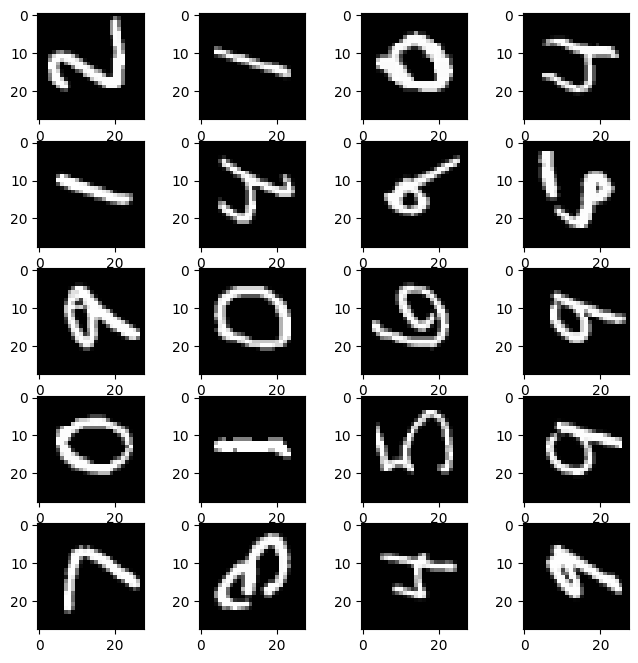

In [15]:
images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_mnist/encoded_mnist_test_ViT-L-14_commonpool_xl_s13b_b90k_28_rot_90.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt
# visulize the images
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')


In [16]:
import os

mnist_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-L-14'
clip_pretrained = 'commonpool_xl_s13b_b90k'
save_path = '../data'
batch_size = 512
resize_length = 28
rotation_angle = 45

os.makedirs(save_path, exist_ok=True)

save_encoded_rotated_mnist(mnist_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, rotation_angle)

Begin Encoding Rotated MNIST training datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 118/118 [14:53<00:00,  7.57s/it]


Begin Encoding Rotated MNIST testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [02:29<00:00,  7.47s/it]


Encoded Rotated MNIST datasets saved.


torch.Size([10000, 768]) torch.Size([10000]) torch.Size([10000, 1, 28, 28])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


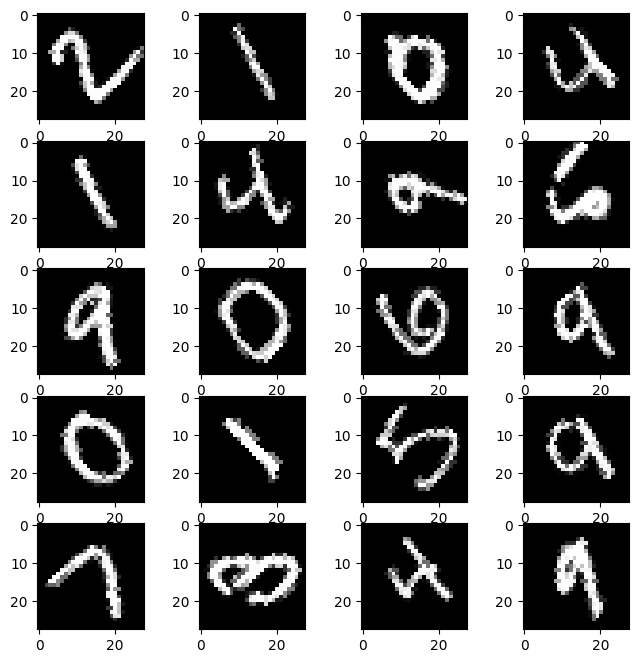

In [17]:
images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_mnist/encoded_mnist_test_ViT-L-14_commonpool_xl_s13b_b90k_28_rot_45.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt
# visulize the images
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap='gray')


In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
import open_clip
from tqdm import tqdm

def save_encoded_celeba(celeba_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length):

    transform = transforms.Compose([
        transforms.CenterCrop(178),  # Center crop to square (178x178)
        transforms.Resize((resize_length, resize_length)), # Resize to 32x32
        transforms.ToTensor()        # Convert to tensor
    ])
    
    # Load CelebA dataset with attributes
    celeba_dataset = torchvision.datasets.CelebA(root=celeba_path, split='all', target_type='attr', transform=transform, download=True)
    
    # The index of the 'Male' attribute in the CelebA attribute file
    male_idx = celeba_dataset.attr_names.index('Male')
        
    # Get indices for male and female images
    male_indices = [i for i, attr in enumerate(celeba_dataset.attr) if attr[male_idx] == 1]
    female_indices = [i for i, attr in enumerate(celeba_dataset.attr) if attr[male_idx] == 0]
    
    # Create subsets for male and female datasets
    male_dataset = Subset(celeba_dataset, male_indices)
    female_dataset = Subset(celeba_dataset, female_indices)
    
    # Do random split for datasets to create train and test datasets
    train_male_dataset, test_male_dataset = random_split(male_dataset, [0.8, 0.2])
    train_female_dataset, test_female_dataset = random_split(female_dataset, [0.8, 0.2])
        
    # Create DataLoaders for the male and female datasets
    train_male_dataloader = DataLoader(train_male_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=True)
    test_male_dataloader = DataLoader(test_male_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=True)
    train_female_dataloader = DataLoader(train_female_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=True)
    test_female_dataloader = DataLoader(test_female_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=True)
    
    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(celeba_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)
                # break

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    # Encode the CelebA training and test datasets
    print("Begin Encoding CelebA male training datasets saved.")
    train_male_encoded_vectors, train_male_targets, train_male_batches = encode_dataset(train_male_dataloader)
    print("Begin Encoding CelebA male testing datasets saved.")
    test_male_encoded_vectors, test_male_targets, test_male_batches = encode_dataset(test_male_dataloader)
    
    print("Begin Encoding CelebA female training datasets saved.")
    train_female_encoded_vectors, train_female_targets, train_female_batches = encode_dataset(train_female_dataloader)
    print("Begin Encoding CelebA female testing datasets saved.")
    test_female_encoded_vectors, test_female_targets, test_female_batches = encode_dataset(test_female_dataloader)

    os.makedirs(os.path.join(save_path, 'encoded_celebA'), exist_ok=True)
    
    # Save the encoded vectors and targets
    torch.save((train_male_batches, train_male_encoded_vectors, train_male_targets),
               f'{save_path}/encoded_celebA/encoded_celebA_train_male_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    torch.save((test_male_batches, test_male_encoded_vectors, test_male_targets),
               f'{save_path}/encoded_celebA/encoded_celebA_test_male_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    torch.save((train_female_batches, train_female_encoded_vectors, train_female_targets),
               f'{save_path}/encoded_celebA/encoded_celebA_train_female_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    torch.save((test_female_batches, test_female_encoded_vectors, test_female_targets),
               f'{save_path}/encoded_celebA/encoded_celebA_test_female_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Encoded CelebA datasets saved.")

In [5]:
import os

celeba_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = '../data'
batch_size = 128
resize_length = 32

os.makedirs(save_path, exist_ok=True)
save_encoded_celeba(celeba_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

Files already downloaded and verified
Begin Encoding CelebA male training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 263/263 [1:41:28<00:00, 23.15s/it]


Begin Encoding CelebA male testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 65/65 [25:07<00:00, 23.19s/it]


Begin Encoding CelebA female training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 369/369 [2:22:16<00:00, 23.13s/it]


Begin Encoding CelebA female testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 92/92 [35:30<00:00, 23.16s/it]


Encoded CelebA datasets saved.


torch.Size([23552, 1024]) torch.Size([23552, 40]) torch.Size([23552, 3, 32, 32])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


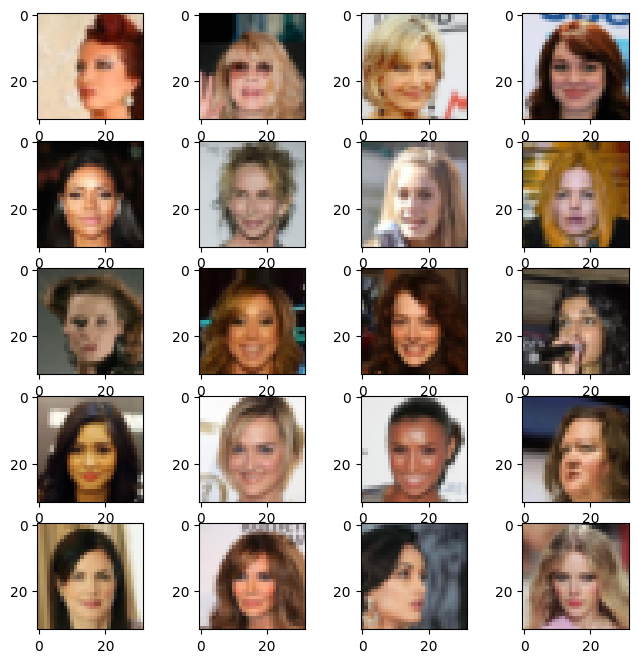

In [6]:
import os

images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_celebA/encoded_celebA_test_female_ViT-H-14-378-quickgelu_dfn5b_32.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt
# visulize the images
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img.permute(1, 2, 0))

In [7]:
import os

celeba_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = '../data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_celeba(celeba_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

Files already downloaded and verified
Begin Encoding CelebA male training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 527/527 [1:42:04<00:00, 11.62s/it]


Begin Encoding CelebA male testing datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 131/131 [25:20<00:00, 11.61s/it]


Begin Encoding CelebA female training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 738/738 [2:22:40<00:00, 11.60s/it]


Begin Encoding CelebA female testing datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 184/184 [35:38<00:00, 11.62s/it]


Encoded CelebA datasets saved.


torch.Size([23552, 1024]) torch.Size([23552, 40]) torch.Size([23552, 3, 64, 64])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


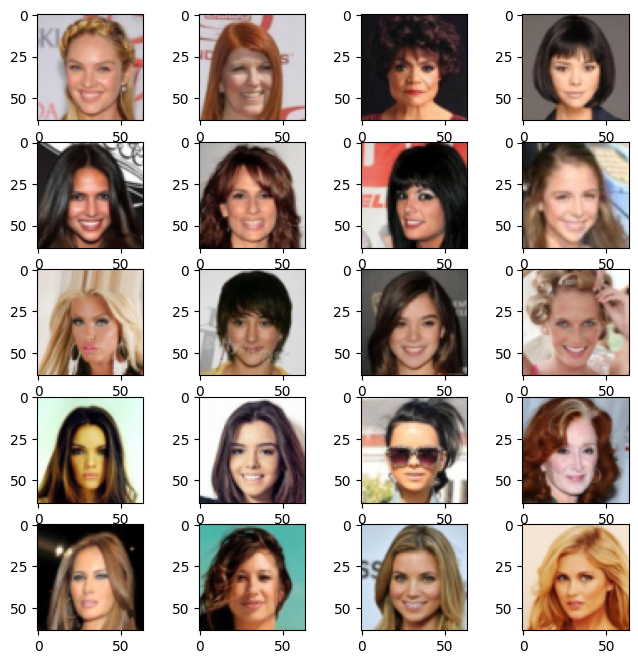

In [8]:
import os

images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_celebA/encoded_celebA_test_female_ViT-H-14-378-quickgelu_dfn5b_64.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt
# visulize the images
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img.permute(1, 2, 0))

In [9]:
import os

celeba_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = '../data'
batch_size = 128
resize_length = 128

os.makedirs(save_path, exist_ok=True)
save_encoded_celeba(celeba_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

Files already downloaded and verified
Begin Encoding CelebA male training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 527/527 [1:47:18<00:00, 12.22s/it]


Begin Encoding CelebA male testing datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 131/131 [25:32<00:00, 11.70s/it]


Begin Encoding CelebA female training datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 738/738 [2:35:45<00:00, 12.66s/it]


Begin Encoding CelebA female testing datasets saved.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 184/184 [35:54<00:00, 11.71s/it]


Encoded CelebA datasets saved.


In [10]:
images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_mnist/encoded_mnist_train_ViT-L-14_commonpool_xl_s13b_b90k_28_rot_45.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

# import matplotlib.pyplot as plt
# # visulize the images
# fig = plt.figure(figsize=(8, 8))
# columns = 4
# rows = 5
# for i in range(1, columns*rows +1):
#     img = images_batch[i].squeeze()
#     fig.add_subplot(rows, columns, i)
#     plt.imshow(img, cmap='gray')



torch.Size([60000, 768]) torch.Size([60000]) torch.Size([60000, 1, 28, 28])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


In [ ]:
import os
import warnings

import torch
from PIL import Image
from torchvision.datasets import VisionDataset
from torchvision.datasets.utils import download_and_extract_archive


class MNISTM(VisionDataset):
    """MNIST-M Dataset.
    """

    resources = [
        ('https://github.com/liyxi/mnist-m/releases/download/data/mnist_m_train.pt.tar.gz',
         '191ed53db9933bd85cc9700558847391'),
        ('https://github.com/liyxi/mnist-m/releases/download/data/mnist_m_test.pt.tar.gz',
         'e11cb4d7fff76d7ec588b1134907db59')
    ]

    training_file = "mnist_m_train.pt"
    test_file = "mnist_m_test.pt"
    classes = ['0 - zero', '1 - one', '2 - two', '3 - three', '4 - four',
               '5 - five', '6 - six', '7 - seven', '8 - eight', '9 - nine']

    @property
    def train_labels(self):
        warnings.warn("train_labels has been renamed targets")
        return self.targets

    @property
    def test_labels(self):
        warnings.warn("test_labels has been renamed targets")
        return self.targets

    @property
    def train_data(self):
        warnings.warn("train_data has been renamed data")
        return self.data

    @property
    def test_data(self):
        warnings.warn("test_data has been renamed data")
        return self.data

    def __init__(self, root, train=True, transform=None, target_transform=None, download=False):
        """Init MNIST-M dataset."""
        super(MNISTM, self).__init__(root, transform=transform, target_transform=target_transform)

        self.train = train

        if download:
            self.download()

        if not self._check_exists():
            raise RuntimeError("Dataset not found." +
                               " You can use download=True to download it")

        if self.train:
            data_file = self.training_file
        else:
            data_file = self.test_file

        print(os.path.join(self.processed_folder, data_file))

        self.data, self.targets = torch.load(os.path.join(self.processed_folder, data_file))

    def __getitem__(self, index):
        """Get images and target for data loader.
        Args:
            index (int): Index
        Returns:
            tuple: (image, target) where target is index of the target class.
        """
        img, target = self.data[index], int(self.targets[index])

        # doing this so that it is consistent with all other datasets
        # to return a PIL Image
        img = Image.fromarray(img.squeeze().numpy(), mode="RGB")

        if self.transform is not None:
            img = self.transform(img)

        if self.target_transform is not None:
            target = self.target_transform(target)

        return img, target

    def __len__(self):
        """Return size of dataset."""
        return len(self.data)

    @property
    def raw_folder(self):
        return os.path.join(self.root, self.__class__.__name__, 'raw')

    @property
    def processed_folder(self):
        return os.path.join(self.root, self.__class__.__name__, 'processed')

    @property
    def class_to_idx(self):
        return {_class: i for i, _class in enumerate(self.classes)}

    def _check_exists(self):
        return (os.path.exists(os.path.join(self.processed_folder, self.training_file)) and
                os.path.exists(os.path.join(self.processed_folder, self.test_file)))

    def download(self):
        """Download the MNIST-M data."""

        if self._check_exists():
            return

        os.makedirs(self.raw_folder, exist_ok=True)
        os.makedirs(self.processed_folder, exist_ok=True)

        # download files
        for url, md5 in self.resources:
            filename = url.rpartition('/')[2]
            download_and_extract_archive(url, download_root=self.raw_folder,
                                         extract_root=self.processed_folder,
                                         filename=filename, md5=md5)

        print('Done!')

    def extra_repr(self):
        return "Split: {}".format("Train" if self.train is True else "Test")

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
import open_clip
from tqdm import tqdm

def save_encoded_mnistm(mnistm_path, device, clip_model, clip_pretrained, save_path, batch_size):
    # Load the MNIST-M dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_dataset = MNISTM(mnistm_path, train=True, transform=transform, download=True)
    test_dataset = MNISTM(mnistm_path, train=False, transform=transform, download=True)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(mnistm_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batches = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batches.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batches = torch.cat(images_batches)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batches

    # Encode the MNIST-M training and test datasets
    print("Begin Encoding MNIST-M training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batches = encode_dataset(train_loader)
    print("Begin Encoding MNIST-M testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batches = encode_dataset(test_loader)
    
    os.makedirs(os.path.join(save_path, 'encoded_mnistm'), exist_ok=True)

    # Save the encoded vectors and targets
    torch.save((train_images_batches, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_mnistm/encoded_mnistm_train_{clip_model}_{clip_pretrained}_32.pth')
    torch.save((test_images_batches, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_mnistm/encoded_mnistm_test_{clip_model}_{clip_pretrained}_32.pth')

    print("Encoded MNIST-M datasets saved.")


In [ ]:
import os

mnistm_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = '../data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_mnistm(mnistm_path, device, clip_model, clip_pretrained, save_path, batch_size)

torch.Size([60000, 1024]) torch.Size([60000]) torch.Size([60000, 3, 28, 28])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


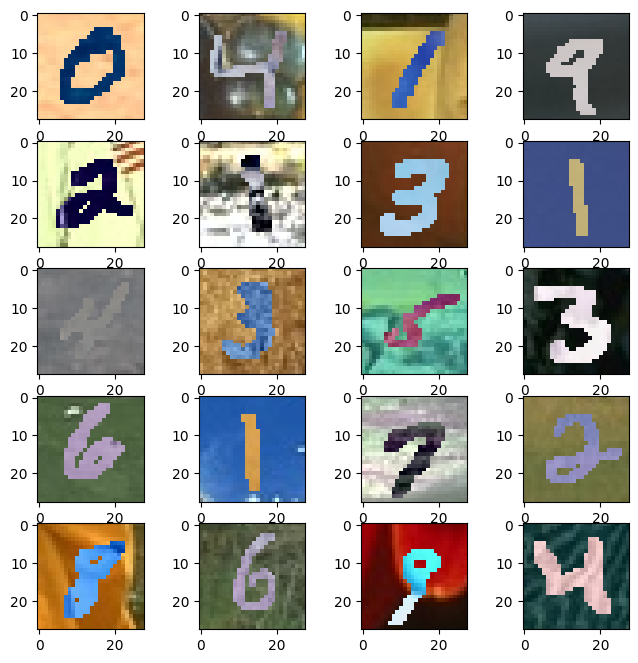

In [1]:
import torch
import os

images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_mnistm/encoded_mnistm_train_ViT-H-14-378-quickgelu_dfn5b_32.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt
# visulize the images
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img.permute(1, 2, 0))

In [2]:
import os
import warnings

import torch
from PIL import Image
from torchvision.datasets import VisionDataset
from torchvision.datasets.utils import download_and_extract_archive


class SyntheticDigits(VisionDataset):
    """Synthetic Digits Dataset.
    """

    resources = [
        ('https://github.com/liyxi/synthetic-digits/releases/download/data/synth_train.pt.gz',
         'd0e99daf379597e57448a89fc37ae5cf'),
        ('https://github.com/liyxi/synthetic-digits/releases/download/data/synth_test.pt.gz',
         '669d94c04d1c91552103e9aded0ee625')
    ]

    training_file = "synth_train.pt"
    test_file = "synth_test.pt"
    classes = ['0 - zero', '1 - one', '2 - two', '3 - three', '4 - four',
               '5 - five', '6 - six', '7 - seven', '8 - eight', '9 - nine']

    @property
    def train_labels(self):
        warnings.warn("train_labels has been renamed targets")
        return self.targets

    @property
    def test_labels(self):
        warnings.warn("test_labels has been renamed targets")
        return self.targets

    @property
    def train_data(self):
        warnings.warn("train_data has been renamed data")
        return self.data

    @property
    def test_data(self):
        warnings.warn("test_data has been renamed data")
        return self.data

    def __init__(self, root, train=True, transform=None, target_transform=None, download=False):
        """Init Synthetic Digits dataset."""
        super(SyntheticDigits, self).__init__(root, transform=transform, target_transform=target_transform)

        self.train = train

        if download:
            self.download()

        if not self._check_exists():
            raise RuntimeError("Dataset not found." +
                               " You can use download=True to download it")

        if self.train:
            data_file = self.training_file
        else:
            data_file = self.test_file

        print(os.path.join(self.processed_folder, data_file))

        self.data, self.targets = torch.load(os.path.join(self.processed_folder, data_file))

    def __getitem__(self, index):
        """Get images and target for data loader.
        Args:
            index (int): Index
        Returns:
            tuple: (image, target) where target is index of the target class.
        """
        img, target = self.data[index], int(self.targets[index])

        # doing this so that it is consistent with all other datasets
        # to return a PIL Image
        img = Image.fromarray(img.squeeze().numpy(), mode="RGB")

        if self.transform is not None:
            img = self.transform(img)

        if self.target_transform is not None:
            target = self.target_transform(target)

        return img, target

    def __len__(self):
        """Return size of dataset."""
        return len(self.data)

    @property
    def raw_folder(self):
        return os.path.join(self.root, self.__class__.__name__, 'raw')

    @property
    def processed_folder(self):
        return os.path.join(self.root, self.__class__.__name__, 'processed')

    @property
    def class_to_idx(self):
        return {_class: i for i, _class in enumerate(self.classes)}

    def _check_exists(self):
        return (os.path.exists(os.path.join(self.processed_folder, self.training_file)) and
                os.path.exists(os.path.join(self.processed_folder, self.test_file)))

    def download(self):
        """Download the Synthetic Digits data."""

        if self._check_exists():
            return

        os.makedirs(self.raw_folder, exist_ok=True)
        os.makedirs(self.processed_folder, exist_ok=True)

        # download files
        for url, md5 in self.resources:
            filename = url.rpartition('/')[2]
            download_and_extract_archive(url, download_root=self.raw_folder,
                                         extract_root=self.processed_folder,
                                         filename=filename, md5=md5)

        print('Done!')

    def extra_repr(self):
        return "Split: {}".format("Train" if self.train is True else "Test")

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
import open_clip
from tqdm import tqdm

def save_encoded_syn(syn_path, device, clip_model, clip_pretrained, save_path, batch_size):
    
    # Load the SYN dataset
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_dataset = SyntheticDigits(syn_path, train=True, transform=transform, download=True)
    test_dataset = SyntheticDigits(syn_path, train=False, transform=transform, download=True)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(syn_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batches = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batches.append(images.cpu())
                targets.append(labels)

        encoded_vectors = torch.cat(encoded_vectors)
        images_batches = torch.cat(images_batches)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batches

    # Encode the SYN training and test datasets
    print("Begin Encoding SYN training datasets saved.")
    train_encoded_vectors, train_targets, train_images_batches = encode_dataset(train_loader)
    print("Begin Encoding SYN testing datasets saved.")
    test_encoded_vectors, test_targets, test_images_batches = encode_dataset(test_loader)
    
    os.makedirs(os.path.join(save_path, 'encoded_syn'), exist_ok=True)

    # Save the encoded vectors and targets
    torch.save((train_images_batches, train_encoded_vectors, train_targets),
               f'{save_path}/encoded_syn/encoded_syn_train_{clip_model}_{clip_pretrained}_32.pth')
    torch.save((test_images_batches, test_encoded_vectors, test_targets),
               f'{save_path}/encoded_syn/encoded_syn_test_{clip_model}_{clip_pretrained}_32.pth')

    print("Encoded SYN datasets saved.")

In [5]:
import os

syn_path = '../data'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = '../data'
batch_size = 128

os.makedirs(save_path, exist_ok=True)
save_encoded_syn(syn_path, device, clip_model, clip_pretrained, save_path, batch_size)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 892057743/892057743 [01:48<00:00, 8237557.88it/s]


Extracting ../data/SyntheticDigits/raw/synth_train.pt.gz to ../data/SyntheticDigits/processed


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 17783056/17783056 [00:02<00:00, 6643892.80it/s]


Extracting ../data/SyntheticDigits/raw/synth_test.pt.gz to ../data/SyntheticDigits/processed
Done!
../data/SyntheticDigits/processed/synth_train.pt
../data/SyntheticDigits/processed/synth_test.pt
Begin Encoding SYN training datasets saved.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3746/3746 [12:27:30<00:00, 11.97s/it]


Begin Encoding SYN testing datasets saved.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [14:27<00:00, 11.56s/it]


Encoded SYN datasets saved.


torch.Size([479400, 1024]) torch.Size([479400]) torch.Size([479400, 3, 32, 32])
<class 'torch.Tensor'> <class 'torch.Tensor'> <class 'torch.Tensor'>
torch.float32 torch.int64 torch.float32


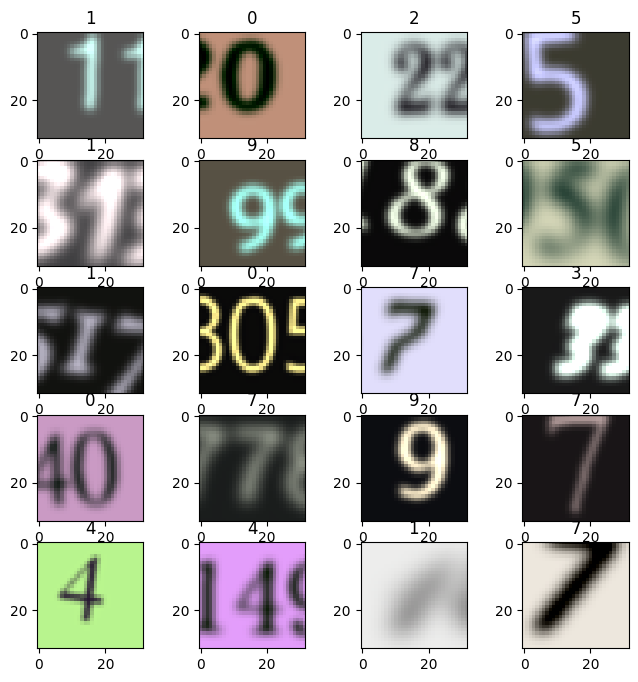

In [7]:
import torch
import os

images_batch, encoded_vectors, targets = torch.load(os.path.join('../data', 'encoded_syn/encoded_syn_train_ViT-H-14-378-quickgelu_dfn5b_32.pth'))

print(encoded_vectors.shape, targets.shape, images_batch.shape)
# check the data type
print(type(encoded_vectors), type(targets), type(images_batch))
# check the dtype
print(encoded_vectors.dtype, targets.dtype, images_batch.dtype)

import matplotlib.pyplot as plt

# visulize the images with labels as title
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = images_batch[i].squeeze()
    fig.add_subplot(rows, columns, i)
    plt.imshow(img.permute(1, 2, 0))
    plt.title(targets[i].item())
    
        

#### FairFace

In [1]:
import os
import gdown
import zipfile

# Google Drive ID of the FairFace dataset (use the ID from your Google Drive link)
fairface_id = "1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86"
output_zip = "fairface.zip"

# Function to download the dataset using gdown
def download_fairface():
    if not os.path.exists(output_zip):
        print(f"Downloading FairFace dataset from Google Drive...")
        gdown.download(f"https://drive.google.com/uc?id={fairface_id}", output_zip, quiet=False)
        print("Download complete.")
    else:
        print("FairFace dataset already downloaded.")

# Function to unzip the dataset
def unzip_fairface():
    if not os.path.exists("fairface"):
        print("Extracting the dataset...")
        with zipfile.ZipFile(output_zip, 'r') as zip_ref:
            zip_ref.extractall("fairface")
        print("Extraction complete.")
    else:
        print("Dataset already extracted.")

# Main process
if __name__ == "__main__":
    download_fairface()
    unzip_fairface()

 

Downloading...
From (original): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86
From (redirected): https://drive.google.com/uc?id=1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86&confirm=t&uuid=b1f70ef5-d214-450c-96c1-09fbce0f1429
To: /local/scratch/a/lim316/research/vaub-gp-pl-hydra/fairface.zip
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 578M/578M [00:08<00:00, 69.2MB/s]


Download complete.
Extracting the dataset...
Extraction complete.


In [20]:
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import torch

# URL for CSV files
train_csv_url = "https://drive.google.com/uc?export=download&id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH"
val_csv_url = "https://drive.google.com/uc?export=download&id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D"

# # Download CSV files (you can use wget or gdown)
# train_csv = pd.read_csv(train_csv_url)
# val_csv = pd.read_csv(val_csv_url)

# Discretization mappings
race_mapping = {
    "White": 0,
    "Black": 1,
    "East Asian": 2,
    "Southeast Asian": 3,
    "Indian": 4,
    "Latino_Hispanic": 5,
    "Middle Eastern": 6,
    "Other": 7,
}

gender_mapping = {
    "Male": 0,
    "Female": 1,
}

age_mapping = {
    "0-2": 0,
    "3-9": 1,
    "10-19": 2,
    "20-29": 3,
    "30-39": 4,
    "40-49": 5,
    "50-59": 6,
    "60-69": 7,
    "more than 70": 8,
}

# Reverse mappings for label visualization
reverse_race_mapping = {v: k for k, v in race_mapping.items()}
reverse_gender_mapping = {v: k for k, v in gender_mapping.items()}
reverse_age_mapping = {v: k for k, v in age_mapping.items()}

# Define your custom PyTorch dataset
class FairFaceDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the CSV file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.labels = pd.read_csv(csv_file)  # Read the CSV file
        self.root_dir = root_dir  # Root directory for the images
        self.transform = transform  # Apply transformations to the images (e.g., resizing, normalization)

        # Discretize race, gender, and age labels using mappings
        self.labels['race'] = self.labels['race'].map(race_mapping)
        self.labels['gender'] = self.labels['gender'].map(gender_mapping)
        self.labels['age'] = self.labels['age'].map(age_mapping)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Get image path from CSV and load the image
        img_name = os.path.join(self.root_dir, self.labels.iloc[idx, 0])  # Image filename
        image = Image.open(img_name)  # Load the image

        # Get the labels (race, gender, age) as a tensor
        race_label = self.labels.iloc[idx, self.labels.columns.get_loc('race')]
        gender_label = self.labels.iloc[idx, self.labels.columns.get_loc('gender')]
        age_label = self.labels.iloc[idx, self.labels.columns.get_loc('age')]

        labels = {
            "race": race_label,
            "gender": gender_label,
            "age": age_label
        }

        # Apply transformations to the image
        if self.transform:
            image = self.transform(image)

        return image, labels

# Path to the FairFace dataset (train and val folders)
train_dir = "fairface"
val_dir = "fairface"

# Apply transformations (example: resizing, converting to tensor)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to the required dimension (e.g., 224x224)
    transforms.ToTensor(),  # Convert PIL image to tensor
])

# Create train and validation datasets
train_dataset = FairFaceDataset(csv_file=train_csv_url, root_dir=train_dir, transform=transform)
val_dataset = FairFaceDataset(csv_file=val_csv_url, root_dir=val_dir, transform=transform)

# Function to plot images with labels
def plot_images(images, labels, num_images=8):
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    
    for i in range(num_images):
        img = images[i].permute(1, 2, 0).numpy()  # Convert tensor to numpy and adjust dimensions
        
        # Access individual labels for race, gender, and age
        race = reverse_race_mapping[labels['race'][i].item()]
        gender = reverse_gender_mapping[labels['gender'][i].item()]
        age = reverse_age_mapping[labels['age'][i].item()]

        # Plot the image and display race, gender, and age as the title
        axes[i].imshow(img)
        axes[i].set_title(f"{race}\n{gender}, {age}")
        axes[i].axis('off')

    plt.show()


In [1]:
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
import matplotlib.pyplot as plt
import torch

# Discretization mappings
race_mapping = {
    "White": 0,
    "Black": 1,
    "East Asian": 2,
    "Southeast Asian": 3,
    "Indian": 4,
    "Latino_Hispanic": 5,
    "Middle Eastern": 6,
}

gender_mapping = {
    "Male": 0,
    "Female": 1,
}

age_mapping = {
    "0-2": 0,
    "3-9": 1,
    "10-19": 2,
    "20-29": 3,
    "30-39": 4,
    "40-49": 5,
    "50-59": 6,
    "60-69": 7,
    "more than 70": 8,
}

# Reverse mappings for label visualization
reverse_race_mapping = {v: k for k, v in race_mapping.items()}
reverse_gender_mapping = {v: k for k, v in gender_mapping.items()}
reverse_age_mapping = {v: k for k, v in age_mapping.items()}

# Define your custom PyTorch dataset
class FairFaceDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.labels = pd.read_csv(csv_file)  # Read the CSV file
        self.root_dir = root_dir  # Root directory for the images
        self.transform = transform  # Apply transformations to the images

        # Discretize race, gender, and age labels using mappings
        self.labels['race'] = self.labels['race'].map(race_mapping)
        self.labels['gender'] = self.labels['gender'].map(gender_mapping)
        self.labels['age'] = self.labels['age'].map(age_mapping)

        # Precompute attribute indices for filtering by race, gender, and age
        self.race_indices = {race: [] for race in race_mapping.values()}
        self.gender_indices = {gender: [] for gender in gender_mapping.values()}
        self.age_indices = {age: [] for age in age_mapping.values()}

        for idx, row in self.labels.iterrows():
            self.race_indices[row['race']].append(idx)
            self.gender_indices[row['gender']].append(idx)
            self.age_indices[row['age']].append(idx)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.labels.iloc[idx, 0])  # Image filename
        image = Image.open(img_name)  # Load the image

        # Get the labels (race, gender, age) as a tensor
        race_label = self.labels.iloc[idx, self.labels.columns.get_loc('race')]
        gender_label = self.labels.iloc[idx, self.labels.columns.get_loc('gender')]
        age_label = self.labels.iloc[idx, self.labels.columns.get_loc('age')]

        labels = {
            "race": race_label,
            "gender": gender_label,
            "age": age_label
        }

        # Apply transformations to the image
        if self.transform:
            image = self.transform(image)

        return image, labels

    def get_filtered_indices(self, attr, attr_value):
        """
        Returns a list of indices for a specific attribute.
        :param attr: 'race', 'gender', or 'age' (string)
        :param attr_value: Integer value representing the attribute
        :return: List of indices matching the attribute value.
        """
        if attr == 'race':
            return self.race_indices[attr_value]
        elif attr == 'gender':
            return self.gender_indices[attr_value]
        elif attr == 'age':
            return self.age_indices[attr_value]
        else:
            raise ValueError(f"Unknown attribute: {attr}")

# Function to plot images with labels
def plot_images(images, labels, num_images=8):
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    
    for i in range(num_images):
        img = images[i].permute(1, 2, 0).numpy()  # Convert tensor to numpy and adjust dimensions
        
        # Access individual labels for race, gender, and age
        race = reverse_race_mapping[labels['race'][i].item()]
        gender = reverse_gender_mapping[labels['gender'][i].item()]
        age = reverse_age_mapping[labels['age'][i].item()]

        # Plot the image and display race, gender, and age as the title
        axes[i].imshow(img)
        axes[i].set_title(f"{race}\n{gender}, {age}")
        axes[i].axis('off')

    plt.show()

# Path to the FairFace dataset (train and val folders)
train_dir = "fairface"
# URL for CSV files
train_csv_url = "https://drive.google.com/uc?export=download&id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH"
val_csv_url = "https://drive.google.com/uc?export=download&id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D"

# Apply transformations (e.g., resizing, converting to tensor)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224
    transforms.ToTensor(),  # Convert PIL image to tensor
])



In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
import open_clip
from tqdm import tqdm

def save_encoded_FairFace(fairface_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, subset='race'):
    
    def extract_list_of_dict_to_tensor(data):
        # Initialize lists to hold concatenated tensors for each category
        all_race = []
        all_gender = []
        all_age = []
    
        # Iterate through each mini-batch in the list of dictionaries
        for batch in data:
            all_race.append(batch['race'])
            all_gender.append(batch['gender'])
            all_age.append(batch['age'])
    
        # Concatenate the lists into tensors
        race_tensor = torch.cat(all_race).view((-1, 1))
        gender_tensor = torch.cat(all_gender).view((-1, 1))
        age_tensor = torch.cat(all_age).view((-1, 1))
    
        # Stack all the batch tensors into a single 2D tensor
    
        return torch.cat((race_tensor, gender_tensor, age_tensor), dim=1)

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(model, preprocess, data_loader):
        encoded_vectors = []
        targets_temp = []
        images_batch = []

        model.eval()
        with torch.no_grad():
            i = 0
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batch.append(images.cpu())
                targets_temp.append(labels)
                # break

        encoded_vectors = torch.cat(encoded_vectors)
        images_batch = torch.cat(images_batch)
        targets = extract_list_of_dict_to_tensor(targets_temp)
        return encoded_vectors, targets, images_batch

    transform = transforms.Compose([
        transforms.CenterCrop(178),  # Center crop to square (178x178)
        transforms.Resize((resize_length, resize_length)), # Resize to 32x32
        transforms.ToTensor()        # Convert to tensor
    ])

    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(fairface_path),
        device=device,
    )

    # URL for CSV files
    train_csv_url = "https://drive.google.com/uc?export=download&id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH"
    val_csv_url = "https://drive.google.com/uc?export=download&id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D"
    # Create train and validation datasets
    train_dataset = FairFaceDataset(csv_file=train_csv_url, root_dir=fairface_path, transform=transform)
    val_dataset = FairFaceDataset(csv_file=val_csv_url, root_dir=fairface_path, transform=transform)

    if subset == 'race':
        n_subset = 7
    elif subset == 'age':
        n_subset = 9
    elif subset == 'gender':
        n_subset = 2
    else:
        raise ValueError("Invalid subset name.")
        
    for i in range(n_subset):
        train_indices = train_dataset.get_filtered_indices(subset, i)
        val_indices = val_dataset.get_filtered_indices(subset, i)
        temp_train_dataset = Subset(train_dataset, list(set(train_indices)))
        temp_val_dataset = Subset(val_dataset, list(set(val_indices)))
        train_dataloader = DataLoader(temp_train_dataset, batch_size=batch_size, shuffle=True, num_workers=16)
        val_dataloader = DataLoader(temp_val_dataset, batch_size=batch_size, shuffle=False, num_workers=16)

        print(f"Begin Encoding FairFace {subset} training datasets index {i} saved.")
        train_encoded_vectors, train_targets, train_batches = encode_dataset(model, preprocess, train_dataloader)

        torch.save((train_batches, train_encoded_vectors, train_targets),
                   f'{save_path}/encoded_FairFace/encoded_FairFace_train_{subset}_{i}_{clip_model}_{clip_pretrained}_{resize_length}.pth')
        
        print(f"Begin Encoding FairFace {subset} testing datasets index {i} saved.")
        test_encoded_vectors, test_targets, test_batches = encode_dataset(model, preprocess, val_dataloader)

        torch.save((test_batches, test_encoded_vectors, test_targets),
                   f'{save_path}/encoded_FairFace/encoded_FairFace_test_{subset}_{i}_{clip_model}_{clip_pretrained}_{resize_length}.pth')

        os.makedirs(os.path.join(save_path, 'encoded_FairFace'), exist_ok=True)


    print(f"Encoded FairFace datasets {subset} subset saved.")

In [3]:
import os

fairface_path = 'fairface'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = 'data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_FairFace(fairface_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

Begin Encoding FairFace race training datasets index 0 saved.


100%|█████████████████████████████████████████████████████████████████████████████████| 130/130 [24:40<00:00, 11.39s/it]


Begin Encoding FairFace race testing datasets index 0 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 17/17 [03:08<00:00, 11.06s/it]


Begin Encoding FairFace race training datasets index 1 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 96/96 [18:17<00:00, 11.44s/it]


Begin Encoding FairFace race testing datasets index 1 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 13/13 [02:20<00:00, 10.83s/it]


Begin Encoding FairFace race training datasets index 2 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 96/96 [18:23<00:00, 11.49s/it]


Begin Encoding FairFace race testing datasets index 2 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 13/13 [02:20<00:00, 10.79s/it]


Begin Encoding FairFace race training datasets index 3 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 85/85 [16:09<00:00, 11.41s/it]


Begin Encoding FairFace race testing datasets index 3 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00, 10.68s/it]


Begin Encoding FairFace race training datasets index 4 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 97/97 [18:25<00:00, 11.40s/it]


Begin Encoding FairFace race testing datasets index 4 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 12/12 [02:17<00:00, 11.43s/it]


Begin Encoding FairFace race training datasets index 5 saved.


100%|█████████████████████████████████████████████████████████████████████████████████| 105/105 [19:59<00:00, 11.43s/it]


Begin Encoding FairFace race testing datasets index 5 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 13/13 [02:26<00:00, 11.31s/it]


Begin Encoding FairFace race training datasets index 6 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 72/72 [13:48<00:00, 11.50s/it]


Begin Encoding FairFace race testing datasets index 6 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 10/10 [01:49<00:00, 10.96s/it]


Encoded FairFace datasets race subset saved.


In [4]:
import os

fairface_path = 'fairface'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = 'data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_FairFace(fairface_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, subset='gender')

Begin Encoding FairFace gender training datasets index 0 saved.


100%|███████████████████████████████████████████████████████████████████████████████| 360/360 [1:08:37<00:00, 11.44s/it]


Begin Encoding FairFace gender testing datasets index 0 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 46/46 [08:40<00:00, 11.32s/it]


Begin Encoding FairFace gender training datasets index 1 saved.


100%|███████████████████████████████████████████████████████████████████████████████| 319/319 [1:00:49<00:00, 11.44s/it]


Begin Encoding FairFace gender testing datasets index 1 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 41/41 [07:44<00:00, 11.32s/it]


Encoded FairFace datasets gender subset saved.


In [ ]:
import os

fairface_path = 'fairface'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = 'data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_FairFace(fairface_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length, subset='age')

Begin Encoding FairFace age training datasets index 0 saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [02:41<00:00, 11.50s/it]


Begin Encoding FairFace age testing datasets index 0 saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:18<00:00,  9.43s/it]


Begin Encoding FairFace age training datasets index 1 saved.


 16%|█████████████▏                                                                     | 13/82 [02:30<13:09, 11.45s/it]

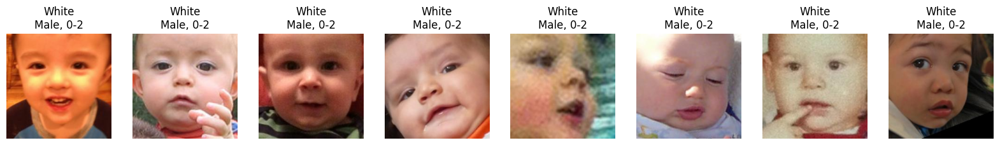

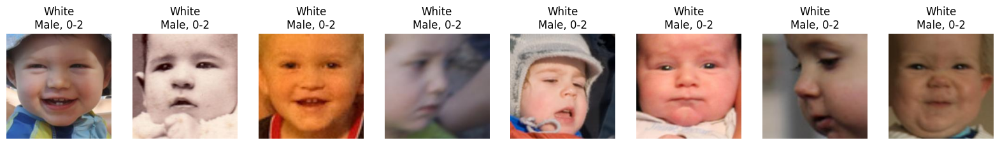

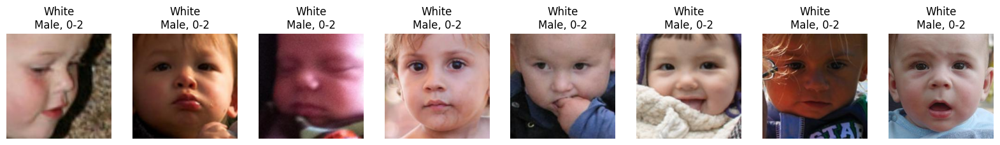

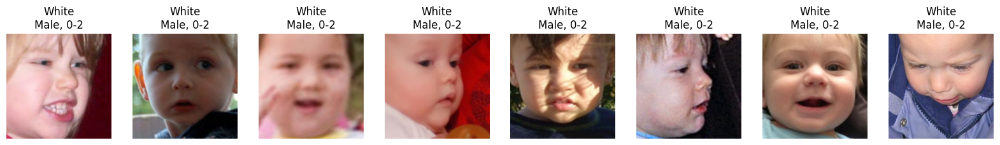

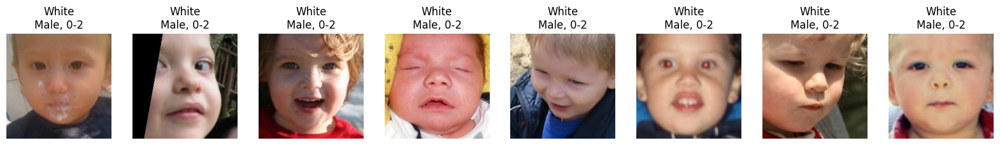

...

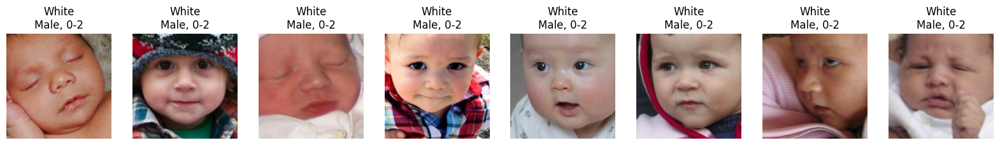

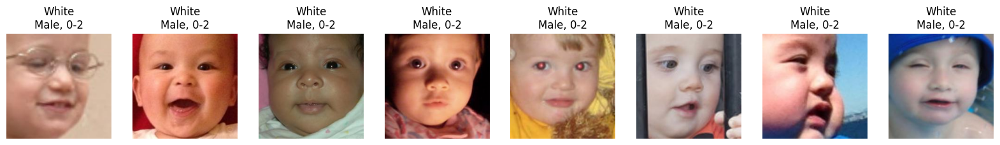

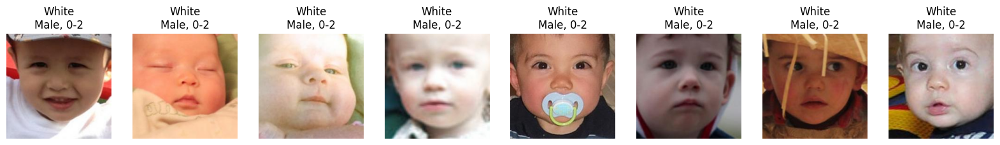

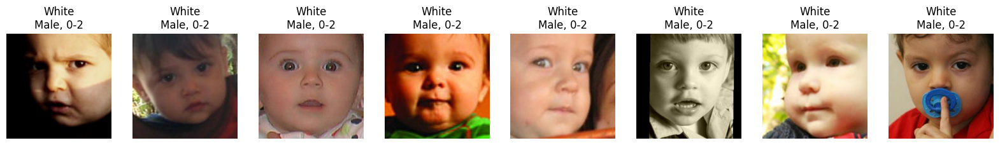

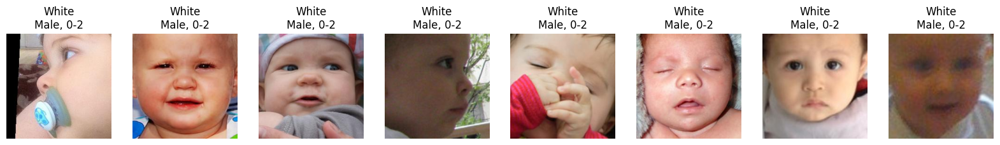

IndexError: index 1 is out of bounds for dimension 0 with size 1

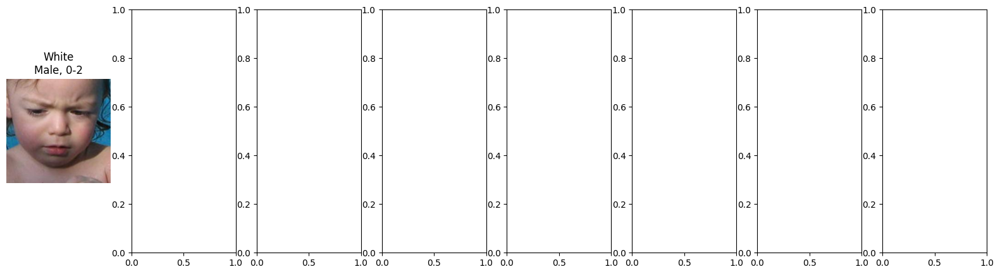

In [27]:
# Path to the FairFace dataset (train and val folders)
train_dir = "fairface"

# URL for CSV files
train_csv_url = "https://drive.google.com/uc?export=download&id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH"
val_csv_url = "https://drive.google.com/uc?export=download&id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D"

# Create the train dataset
train_dataset = FairFaceDataset(csv_file=train_csv_url, root_dir=train_dir, transform=transform)

# Example: Get all indices for race 0 (White) and gender 0 (Male)
race_indices = train_dataset.get_filtered_indices('race', 0)  # White race
gender_indices = train_dataset.get_filtered_indices('gender', 0)  # Male gender
age_indices = train_dataset.get_filtered_indices('age', 0)  # Male gender

# Create a subset for White Male using the intersection of race and gender indices
common_indices = set(race_indices).intersection(gender_indices).intersection(age_indices)
subset_white_male = Subset(train_dataset, list(common_indices))
# Create a DataLoader for the subset
subset_loader = DataLoader(subset_white_male, batch_size=8, shuffle=True)

# Iterate through the subset DataLoader and plot images
for images, labels in subset_loader:
    plot_images(images, labels, num_images=8)  # Plot first 8 images
    if i > 100:
        break 

In [ ]:
# List of dictionaries with tensors
list_of_dicts = [
    {'category1': torch.tensor([1, 2]), 'category2': torch.tensor([3, 4])},
    {'category1': torch.tensor([5, 6]), 'category2': torch.tensor([7, 8])},
    {'category1': torch.tensor([9, 10]), 'category2': torch.tensor([11, 12])}
]

# List to hold concatenated tensors for each batch
batch_list = []

# Iterate through each dictionary in the list
for d in list_of_dicts:
    # Concatenate the tensors for all categories within a single dictionary (per sample)
    batch_tensor = torch.cat([v for k, v in d.items()])
    batch_list.append(batch_tensor)

# Stack all the batch tensors into a single 2D tensor
result_batch_tensor = torch.stack(batch_list)

# Print the result
print(result_batch_tensor)

In [6]:
# Path to the FairFace dataset (train and val folders)
train_dir = "fairface"

# URL for CSV files
train_csv_url = "https://drive.google.com/uc?export=download&id=1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH"
val_csv_url = "https://drive.google.com/uc?export=download&id=1wOdja-ezstMEp81tX1a-EYkFebev4h7D"

# Create the train dataset
train_dataset = FairFaceDataset(csv_file=train_csv_url, root_dir=train_dir, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)

a = []
# Iterate through the subset DataLoader and plot images
for i, (images, labels) in enumerate(train_loader):
    a.append(labels)
    if i > 100:
        break 

In [16]:
def extract_list_of_dict_to_tensor(data):
    # Initialize lists to hold concatenated tensors for each category
    all_race = []
    all_gender = []
    all_age = []

    # Iterate through each mini-batch in the list of dictionaries
    for batch in data:
        all_race.append(batch['race'])
        all_gender.append(batch['gender'])
        all_age.append(batch['age'])

    # Concatenate the lists into tensors
    race_tensor = torch.cat(all_race).view((-1, 1))
    gender_tensor = torch.cat(all_gender).view((-1, 1))
    age_tensor = torch.cat(all_age).view((-1, 1))
    
    # Stack all the batch tensors into a single 2D tensor

    return torch.cat((race_tensor, gender_tensor, age_tensor), dim=1)

# Print the result
print(a)
b = extract_list_of_dict_to_tensor(a)
print(b)
print(b[0])

[{'race': tensor([3, 3, 6, 3, 0, 6, 6, 2]), 'gender': tensor([0, 1, 1, 1, 1, 0, 1, 0]), 'age': tensor([2, 2, 6, 1, 3, 3, 4, 2])}, {'race': tensor([3, 1, 4, 3, 5, 4, 5, 3]), 'gender': tensor([1, 0, 0, 0, 1, 1, 1, 1]), 'age': tensor([3, 2, 1, 4, 6, 1, 3, 8])}, {'race': tensor([0, 4, 2, 5, 3, 0, 0, 5]), 'gender': tensor([0, 1, 1, 1, 0, 0, 1, 0]), 'age': tensor([3, 4, 2, 7, 5, 6, 2, 1])}, {'race': tensor([3, 2, 4, 4, 5, 5, 3, 2]), 'gender': tensor([0, 0, 0, 1, 0, 0, 1, 1]), 'age': tensor([4, 4, 1, 3, 1, 5, 4, 3])}, {'race': tensor([1, 6, 0, 3, 4, 1, 0, 5]), 'gender': tensor([1, 0, 0, 0, 1, 1, 1, 0]), 'age': tensor([1, 3, 6, 1, 2, 4, 3, 6])}, {'race': tensor([5, 5, 0, 6, 0, 2, 0, 2]), 'gender': tensor([0, 0, 0, 0, 0, 0, 0, 0]), 'age': tensor([5, 5, 4, 3, 4, 4, 3, 1])}, {'race': tensor([5, 2, 5, 2, 6, 5, 6, 5]), 'gender': tensor([1, 0, 0, 0, 0, 0, 1, 1]), 'age': tensor([5, 7, 5, 1, 3, 7, 3, 4])}, {'race': tensor([2, 6, 4, 5, 2, 6, 1, 0]), 'gender': tensor([1, 0, 0, 0, 1, 0, 1, 1]), 'age': te

#### Office 31

In [14]:
import os
import gdown
import tarfile

# Google Drive file ID
file_id = '0B4IapRTv9pJ1WGZVd1VDMmhwdlE'
url = f'https://drive.google.com/uc?id={file_id}'

# Define the local path where the dataset will be stored
dataset_dir = "office31_dataset"
tar_file_path = os.path.join(dataset_dir, "office31.tar.gz")

# Create the directory if it doesn't exist
os.makedirs(dataset_dir, exist_ok=True)

# Download the .tar.gz file using gdown
gdown.download(url, tar_file_path, quiet=False)

# Extract the .tar.gz file
def extract_tar_gz(file_path, extract_to):
    try:
        with tarfile.open(file_path, "r:gz") as tar:
            tar.extractall(path=extract_to)
        print(f"Extracted to {extract_to}")
    except tarfile.TarError:
        print(f"Error: The file at {file_path} is not a valid .tar.gz file.")

# Extract the downloaded tar.gz file
extract_tar_gz(tar_file_path, dataset_dir)

# Clean up (optional)
os.remove(tar_file_path)
print("Office-31 dataset downloaded and extracted successfully!")


Downloading...
From (original): https://drive.google.com/uc?id=0B4IapRTv9pJ1WGZVd1VDMmhwdlE
From (redirected): https://drive.google.com/uc?id=0B4IapRTv9pJ1WGZVd1VDMmhwdlE&confirm=t&uuid=12f67ae4-e09c-47ab-a7fa-9181b150a445
To: /local/scratch/a/lim316/research/vaub-gp-pl-hydra/office31_dataset/office31.tar.gz
100%|██████████████████████████████████████████████████████████████████████████████| 77.2M/77.2M [00:00<00:00, 91.9MB/s]


Extracted to office31_dataset
Office-31 dataset downloaded and extracted successfully!


In [23]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import torch

# Define the dataset directory
dataset_dir = "office31_dataset"

# Define transformations (resize, convert to tensor, normalize)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),          # Convert image to PyTorch tensor
])

# Define the domains and assign each domain a label
domains = {'amazon': 0, 'dslr': 1, 'webcam': 2}  # Assign numeric labels to each domain

# Custom Dataset class to return both class and domain labels
class Office31DatasetWithDomain(Dataset):
    def __init__(self, domain_name, domain_label, dataset):
        self.domain_name = domain_name
        self.domain_label = domain_label
        self.dataset = dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        # Get the image and class label from the original dataset
        image, class_label = self.dataset[idx]
        
        # Return image, class label, and domain label
        return image, class_label, self.domain_label

# Dictionary to hold datasets with class and domain labels
domain_datasets = {}

# Load and augment each domain dataset
for domain_name, domain_label in domains.items():
    domain_path = f"{dataset_dir}/{domain_name}/images"
    
    # Load the dataset for the domain using ImageFolder
    dataset = datasets.ImageFolder(root=domain_path, transform=transform)
    
    # Wrap the dataset to include domain labels
    domain_dataset_with_labels = Office31DatasetWithDomain(domain_name, domain_label, dataset)
    
    # Store the dataset in the dictionary
    domain_datasets[domain_name] = domain_dataset_with_labels
    
    # Print some debug information
    print(f"Loaded {domain_name} dataset with {len(dataset)} samples.")
    print(f"Class-to-Label Mapping for {domain_name}: {dataset.class_to_idx}")

# Example: Create DataLoader for one of the domain datasets (you can do this for all domains)
for domain_name, domain_dataset in domain_datasets.items():
    dataloader = DataLoader(domain_dataset, batch_size=32, shuffle=True)
    
    # Fetch one batch of data to inspect
    images, class_labels, domain_labels = next(iter(dataloader))
    
    # Print batch information
    print(f"Domain: {domain_name}, Class Labels: {class_labels}, Domain Labels: {domain_labels}")
    break


Loaded amazon dataset with 2818 samples.
Class-to-Label Mapping for amazon: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone': 20, 'printer': 21, 'projector': 22, 'punchers': 23, 'ring_binder': 24, 'ruler': 25, 'scissors': 26, 'speaker': 27, 'stapler': 28, 'tape_dispenser': 29, 'trash_can': 30}
Loaded dslr dataset with 499 samples.
Class-to-Label Mapping for dslr: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone'

In [25]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset, ConcatDataset
import torch

# Define the dataset directory
dataset_dir = "office31_dataset"

# Define transformations (resize, convert to tensor, normalize)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),          # Convert image to PyTorch tensor
])

# Define the domains and assign each domain a label
domains = {'amazon': 0, 'dslr': 1, 'webcam': 2}  # Assign numeric labels to each domain

# Custom Dataset class to return both class and domain labels in a dict
class Office31DatasetWithDomain(Dataset):
    def __init__(self, domain_name, domain_label, dataset):
        self.domain_name = domain_name
        self.domain_label = domain_label
        self.dataset = dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        # Get the image and class label from the original dataset
        image, class_label = self.dataset[idx]
        
        # Create a dictionary to hold both class and domain labels
        labels = {
            'class_label': class_label,
            'domain_label': self.domain_label
        }
        
        # Return image and labels dictionary
        return image, labels

# List to hold all domain datasets
all_datasets = []

# Load and wrap each domain dataset
for domain_name, domain_label in domains.items():
    domain_path = f"{dataset_dir}/{domain_name}/images"
    
    # Load the dataset for the domain using ImageFolder
    dataset = datasets.ImageFolder(root=domain_path, transform=transform)
    
    # Wrap the dataset to include domain labels
    domain_dataset_with_labels = Office31DatasetWithDomain(domain_name, domain_label, dataset)
    
    # Add the domain dataset to the list of all datasets
    all_datasets.append(domain_dataset_with_labels)
    
    # Print some debug information
    print(f"Loaded {domain_name} dataset with {len(dataset)} samples.")
    print(f"Class-to-Label Mapping for {domain_name}: {dataset.class_to_idx}")

# Concatenate all the domain datasets into one
combined_dataset = ConcatDataset(all_datasets)

# Create a DataLoader for the combined dataset
combined_dataloader = DataLoader(combined_dataset, batch_size=32, shuffle=True)

# Example: Print one batch of images, and their labels (class_label, domain_label) from the combined dataset
images, labels = next(iter(combined_dataloader))
print(f"Batch of images shape: {images.shape}")
print(f"Labels: {labels}")  # This will print out the dictionary containing class and domain labels for each image


Loaded amazon dataset with 2818 samples.
Class-to-Label Mapping for amazon: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone': 20, 'printer': 21, 'projector': 22, 'punchers': 23, 'ring_binder': 24, 'ruler': 25, 'scissors': 26, 'speaker': 27, 'stapler': 28, 'tape_dispenser': 29, 'trash_can': 30}
Loaded dslr dataset with 499 samples.
Class-to-Label Mapping for dslr: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone'

In [27]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define the dataset directory
dataset_dir = "office31_dataset"

# Define transformations (resize, convert to tensor, normalize)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),          # Convert image to PyTorch tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Load each domain separately using ImageFolder
amazon_dataset = datasets.ImageFolder(root=f"{dataset_dir}/amazon/images", transform=transform)
dslr_dataset = datasets.ImageFolder(root=f"{dataset_dir}/dslr/images", transform=transform)
webcam_dataset = datasets.ImageFolder(root=f"{dataset_dir}/webcam/images", transform=transform)

# Optional: Create DataLoaders for each domain
amazon_loader = DataLoader(amazon_dataset, batch_size=32, shuffle=True)
dslr_loader = DataLoader(dslr_dataset, batch_size=32, shuffle=True)
webcam_loader = DataLoader(webcam_dataset, batch_size=32, shuffle=True)

# Example: Print dataset information for each domain
print(f"Amazon dataset: {len(amazon_dataset)} images, Class-to-Label Mapping: {amazon_dataset.class_to_idx}")
print(f"DSLR dataset: {len(dslr_dataset)} images, Class-to-Label Mapping: {dslr_dataset.class_to_idx}")
print(f"Webcam dataset: {len(webcam_dataset)} images, Class-to-Label Mapping: {webcam_dataset.class_to_idx}")

# Example: Load one batch from each domain and print class labels
amazon_images, amazon_labels = next(iter(amazon_loader))
print(f"Amazon batch: {amazon_images.shape}, Class labels: {amazon_labels}")

dslr_images, dslr_labels = next(iter(dslr_loader))
print(f"DSLR batch: {dslr_images.shape}, Class labels: {dslr_labels}")

webcam_images, webcam_labels = next(iter(webcam_loader))
print(f"Webcam batch: {webcam_images.shape}, Class labels: {webcam_labels}")


Amazon dataset: 2818 images, Class-to-Label Mapping: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone': 20, 'printer': 21, 'projector': 22, 'punchers': 23, 'ring_binder': 24, 'ruler': 25, 'scissors': 26, 'speaker': 27, 'stapler': 28, 'tape_dispenser': 29, 'trash_can': 30}
DSLR dataset: 499 images, Class-to-Label Mapping: {'back_pack': 0, 'bike': 1, 'bike_helmet': 2, 'bookcase': 3, 'bottle': 4, 'calculator': 5, 'desk_chair': 6, 'desk_lamp': 7, 'desktop_computer': 8, 'file_cabinet': 9, 'headphones': 10, 'keyboard': 11, 'laptop_computer': 12, 'letter_tray': 13, 'mobile_phone': 14, 'monitor': 15, 'mouse': 16, 'mug': 17, 'paper_notebook': 18, 'pen': 19, 'phone': 20, 'printer': 21, 'projector': 22, 'punch

In [33]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
import open_clip
from tqdm import tqdm
from torchvision import datasets, transforms


def save_encoded_office31(office31_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length):

    transform = transforms.Compose([
        transforms.CenterCrop(178),  # Center crop to square (178x178)
        transforms.Resize((resize_length, resize_length)), # Resize to 32x32
        transforms.ToTensor()        # Convert to tensor
    ])

    # Load each domain separately using ImageFolder
    amazon_dataset = datasets.ImageFolder(root=f"{dataset_dir}/amazon/images", transform=transform)
    dslr_dataset = datasets.ImageFolder(root=f"{dataset_dir}/dslr/images", transform=transform)
    webcam_dataset = datasets.ImageFolder(root=f"{dataset_dir}/webcam/images", transform=transform)
    
    # Do random split for datasets to create train and test datasets
    train_amazon_dataset, test_amazon_dataset = random_split(amazon_dataset, [0.8, 0.2])
    train_dslr_dataset, test_dslr_dataset = random_split(dslr_dataset, [0.8, 0.2])
    train_webcam_dataset, test_webcam_dataset = random_split(webcam_dataset, [0.8, 0.2])
        
    # Create DataLoaders
    train_amazon_dataloader = DataLoader(train_amazon_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    test_amazon_dataloader = DataLoader(test_amazon_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    train_dslr_dataloader = DataLoader(train_dslr_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    test_dslr_dataloader = DataLoader(test_dslr_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    train_webcam_dataloader = DataLoader(train_webcam_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    test_webcam_dataloader = DataLoader(test_webcam_dataset, batch_size=batch_size, shuffle=True, num_workers=16, drop_last=False)
    
    # Load the CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms(
        clip_model,
        pretrained=clip_pretrained,
        cache_dir=os.path.join(office31_path),
        device=device,
    )

    def batch_preprocess(image_batch, preprocess):
        to_pil_image = transforms.ToPILImage()
        image_stack = torch.concat([preprocess(to_pil_image(img)).unsqueeze(0) for img in image_batch])
        return image_stack

    def encode_dataset(data_loader):
        encoded_vectors = []
        targets = []
        images_batchs = []

        model.eval()
        with torch.no_grad():
            for images, labels in tqdm(data_loader):
                images_preprocessed = batch_preprocess(images, preprocess)
                images_preprocessed = images_preprocessed.to(device)
                features = model.encode_image(images_preprocessed)
                encoded_vectors.append(features.cpu())
                images_batchs.append(images.cpu())
                targets.append(labels)
                # break

        encoded_vectors = torch.cat(encoded_vectors)
        images_batchs = torch.cat(images_batchs)
        targets = torch.cat(targets)

        return encoded_vectors, targets, images_batchs

    os.makedirs(os.path.join(save_path, 'encoded_office31'), exist_ok=True)
    # Encode the Office31 training and test datasets
    print("Begin Encoding Office31 amazon training datasets saved.")
    train_amazon_encoded_vectors, train_amazon_targets, train_amazon_batches = encode_dataset(train_amazon_dataloader)
    torch.save((train_amazon_batches, train_amazon_encoded_vectors, train_amazon_targets),
           f'{save_path}/encoded_office31/encoded_office31_train_amazon_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    print("Begin Encoding Office31 amazon testing datasets saved.")
    test_amazon_encoded_vectors, test_amazon_targets, test_amazon_batches = encode_dataset(test_amazon_dataloader)
    torch.save((test_amazon_batches, test_amazon_encoded_vectors, test_amazon_targets),
               f'{save_path}/encoded_office31/encoded_office31_test_amazon_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Begin Encoding Office31 dslr training datasets saved.")
    train_dslr_encoded_vectors, train_dslr_targets, train_dslr_batches = encode_dataset(train_dslr_dataloader)
    torch.save((train_dslr_batches, train_dslr_encoded_vectors, train_dslr_targets),
               f'{save_path}/encoded_office31/encoded_office31_train_dslr_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    print("Begin Encoding Office31 dslr testing datasets saved.")
    test_dslr_encoded_vectors, test_dslr_targets, test_dslr_batches = encode_dataset(test_dslr_dataloader)
    torch.save((test_dslr_batches, test_dslr_encoded_vectors, test_dslr_targets),
               f'{save_path}/encoded_office31/encoded_office31_test_dslr_{clip_model}_{clip_pretrained}_{resize_length}.pth')

    print("Begin Encoding Office31 webcam training datasets saved.")
    train_webcam_encoded_vectors, train_webcam_targets, train_webcam_batches = encode_dataset(train_webcam_dataloader)
    torch.save((train_webcam_batches, train_webcam_encoded_vectors, train_webcam_targets),
               f'{save_path}/encoded_office31/encoded_office31_train_webcam_{clip_model}_{clip_pretrained}_{resize_length}.pth')
    print("Begin Encoding Office31 webcam testing datasets saved.")
    test_webcam_encoded_vectors, test_webcam_targets, test_webcam_batches = encode_dataset(test_webcam_dataloader)
    torch.save((test_webcam_batches, test_webcam_encoded_vectors, test_webcam_targets),
               f'{save_path}/encoded_office31/encoded_office31_test_webcam_{clip_model}_{clip_pretrained}_{resize_length}.pth')


    print("Encoded office31 datasets saved.")

In [34]:
import os

office31_path = 'office31_dataset'
device = 'cuda:3' if torch.cuda.is_available() else 'cpu'
clip_model = 'ViT-H-14-378-quickgelu'
clip_pretrained = 'dfn5b'
save_path = 'data'
batch_size = 128
resize_length = 64

os.makedirs(save_path, exist_ok=True)
save_encoded_office31(office31_path, device, clip_model, clip_pretrained, save_path, batch_size, resize_length)

Begin Encoding Office31 amazon training datasets saved.


100%|███████████████████████████████████████████████████████████████████████████████████| 18/18 [03:24<00:00, 11.37s/it]


Begin Encoding Office31 amazon testing datasets saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:53<00:00, 10.67s/it]


Begin Encoding Office31 dslr training datasets saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:39<00:00,  9.91s/it]


Begin Encoding Office31 dslr testing datasets saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00, 12.16s/it]


Begin Encoding Office31 webcam training datasets saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:00<00:00, 12.06s/it]


Begin Encoding Office31 webcam testing datasets saved.


100%|█████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.80s/it]

Encoded office31 datasets saved.
